# Importing Libraries 


In [1]:
import pandas as pd
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly import tools
import re
from plotly.offline import init_notebook_mode, plot, iplot
from wordcloud import WordCloud, STOPWORDS 
from warnings import filterwarnings
filterwarnings('ignore')
from matplotlib.gridspec import GridSpec
import seaborn as sns
from geopy.geocoders import Nominatim
import folium
from folium.plugins import HeatMap
from folium.plugins import FastMarkerCluster
from wordcloud import WordCloud, STOPWORDS 
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge,Lasso,LogisticRegression
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')


import re
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk

# Reading the dataset


In [2]:
ZomatoData=pd.read_csv('zomato.csv', encoding='latin')
print('Shape before deleting duplicate values:', ZomatoData.shape)

# Removing some of duplicate rows if any present
ZomatoData=ZomatoData.drop_duplicates()
print('Shape After deleting duplicate values:', ZomatoData.shape)

# Printing sample data 

ZomatoData.head(10)
ZomatoData.head()

Shape before deleting duplicate values: (51717, 17)
Shape After deleting duplicate values: (51717, 17)


,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [3]:
# descriptive statistics of the data
ZomatoData.describe(include='all')

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
count,51717,51717,51717,51717,51717,43942,51717.000000,50509,51696,51490,23639,51672,51371,51717,51717,51717,51717
unique,51717,11495,8792,2,2,64,NaN,14926,93,93,5271,2723,70,22513,9098,7,30
top,https://www.zomato.com/bangalore/homemade-deli...,Delivery Only,Cafe Coffee Day,Yes,No,NEW,NaN,080 43334321,BTM,Quick Bites,Biryani,North Indian,300,[],[],Delivery,BTM
freq,1,128,96,30444,45268,2208,NaN,216,5124,19132,182,2913,7576,7595,39617,25942,3279
mean,NaN,NaN,NaN,NaN,NaN,NaN,283.697527,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,803.838853,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,41.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,198.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
ZomatoData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [5]:
# Finging unique values for each column
ZomatoData.nunique()

url                            51717
address                        11495
name                            8792
online_order                       2
book_table                         2
rate                              64
votes                           2328
phone                          14926
location                          93
rest_type                         93
dish_liked                      5271
cuisines                        2723
approx_cost(for two people)       70
reviews_list                   22513
menu_item                       9098
listed_in(type)                    7
listed_in(city)                   30
dtype: int64

# EDA

<AxesSubplot:>

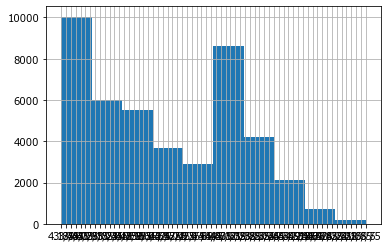

In [6]:
%matplotlib inline

ZomatoData['rate'].hist()

In [7]:
# Function to count the number of cuisines
def cuisine_counter(inpStr):
    NumCuisines=len(str(inpStr).split(','))
    return(NumCuisines)

In [8]:
# Creating a new feature in data
# We will further explore the new feature just like other features
ZomatoData['CuisineCount']=ZomatoData['cuisines'].apply(cuisine_counter)
ZomatoData.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,3
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,3
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,3
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,2
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,2


Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)', 'CuisineCount'],
      dtype='object')

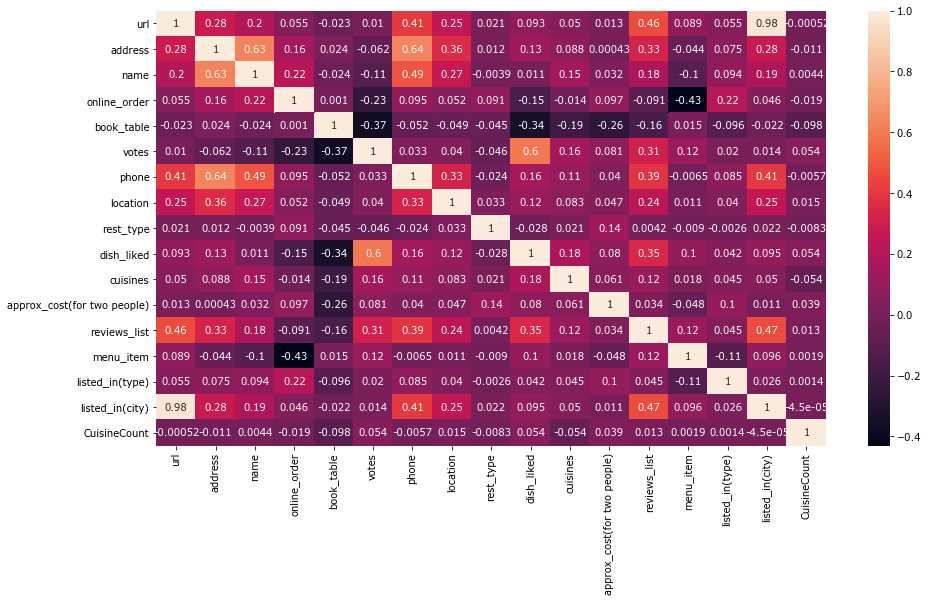

In [9]:


def Encode(ZomatoData):
    for column in ZomatoData.columns[~ZomatoData.columns.isin(['rate', 'cost', 'votes'])]:
        ZomatoData[column] = ZomatoData[column].factorize()[0]
    return ZomatoData

zomato_en = Encode(ZomatoData.copy())
zomato_en.head()

#Get Correlation between different variables
corr = zomato_en.corr(method='kendall')
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)
zomato_en.columns

In [10]:
zomato_en.shape

(51717, 18)

Text(0.5, 0, 'Number of outlets')

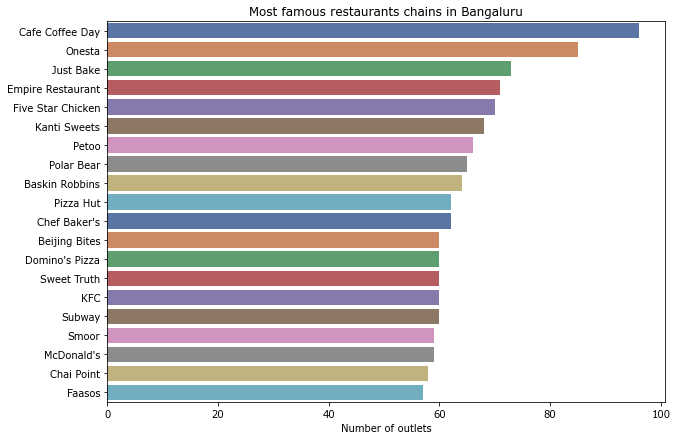

In [11]:
plt.figure(figsize=(10,7))
chains=ZomatoData['name'].value_counts()[:20]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets")

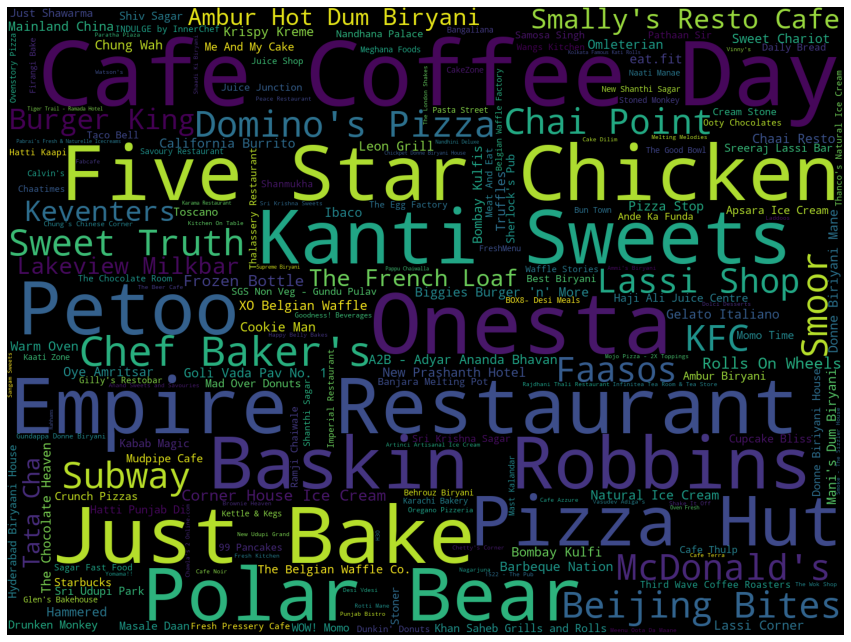

In [12]:
from subprocess import check_output
from wordcloud import WordCloud
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(ZomatoData['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

Analysis of Restaurants based on their Table booking facility

In [13]:
x=ZomatoData['book_table'].value_counts()
colors = ['#96D38C', '#D0F9B1']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Table booking",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

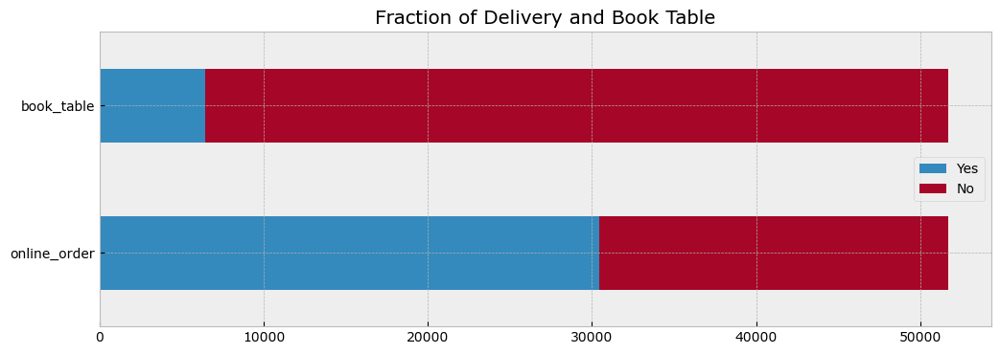

In [14]:
with plt.style.context('bmh', after_reset = True):
    plt.figure(figsize = (12,4))
    ax = plt.subplot(1,1,1)
    tmp = {}
    for col in ['online_order', 'book_table']: 
        tmp[col] = ZomatoData[col].value_counts()
    tmp = pd.DataFrame.from_dict(tmp, orient = 'index')
    tmp.plot.barh(stacked = True, ax = ax)
    ax.set_title('Fraction of Delivery and Book Table')
    plt.show()

Text(0.5, 1.0, 'Type Of Restaurants providing Table booking facility:')

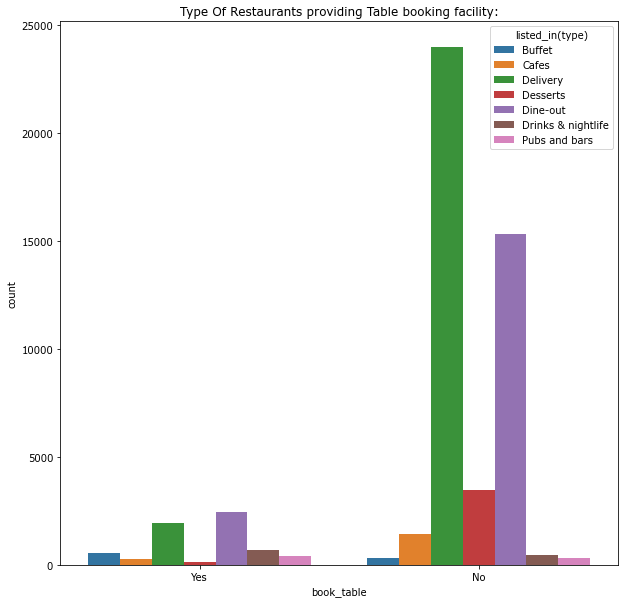

In [15]:
data = ZomatoData

sns.countplot(x=data['book_table'],hue = data['listed_in(type)'])
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Type Of Restaurants providing Table booking facility:')

In [16]:
data.shape

(51717, 18)

Analysis of Restaurants based on LOCATION

Text(0.5, 1.0, ' Location')

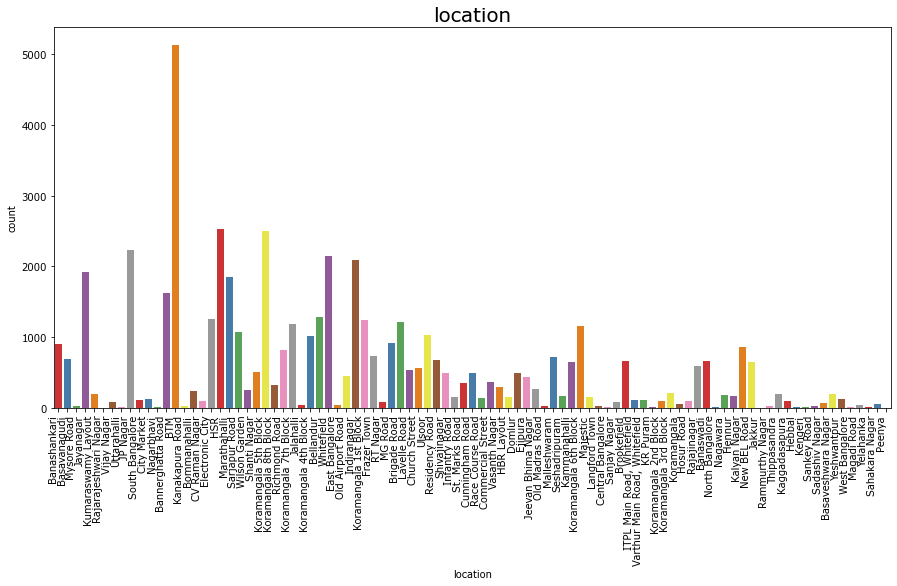

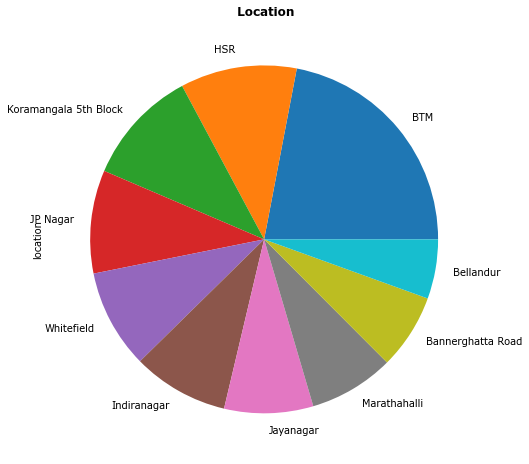

In [17]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 15,7
g = sns.countplot(x="location",data=ZomatoData, palette = "Set1")
g.set_xticklabels(g.get_xticklabels(), rotation=90, ha="right")
g 
plt.title('location',size = 20)



plt.figure(figsize=(8,8))
ax =ZomatoData.location.value_counts()[:10].plot(kind='pie')
plt.title(' Location', weight='bold')




Analysis of Restaurants based on #Restaurant Type

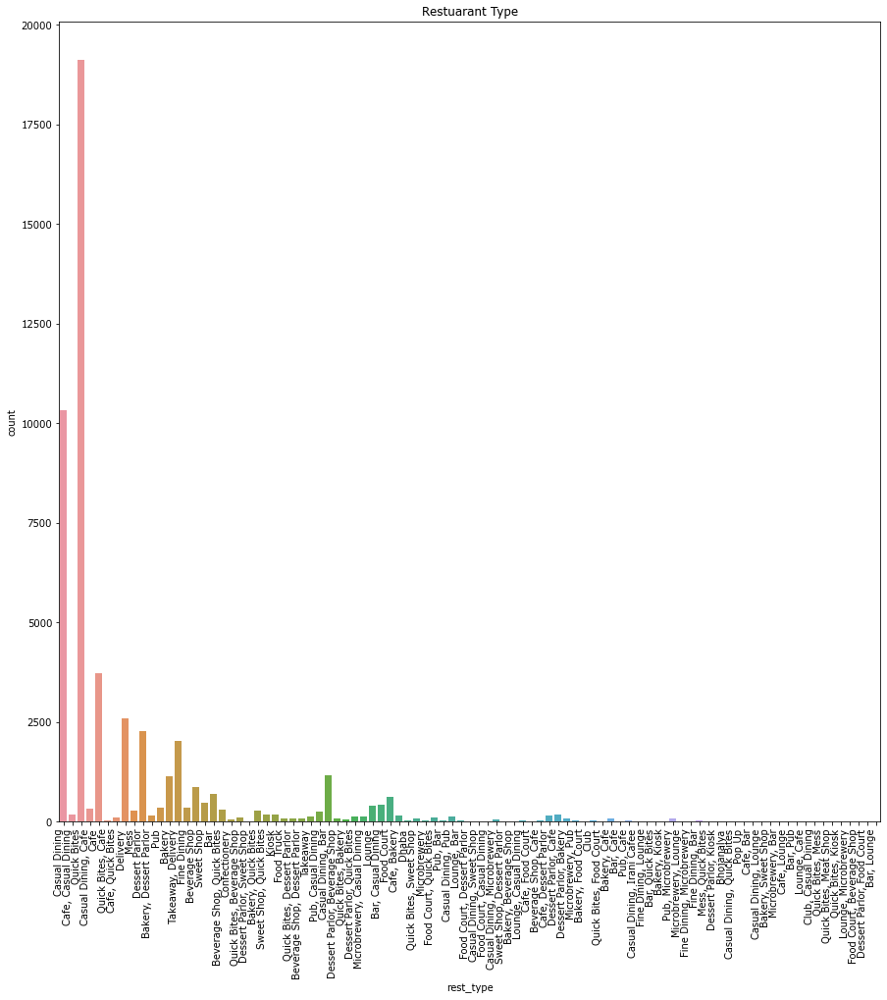

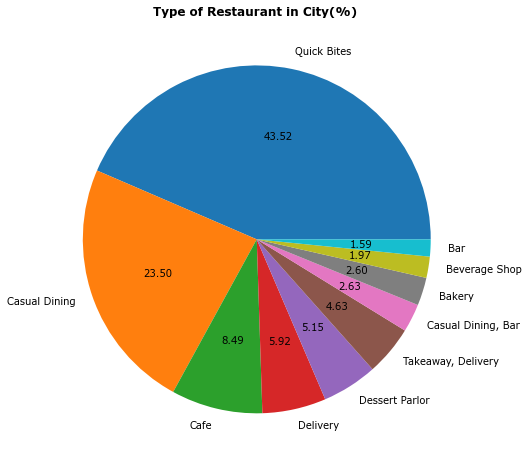

In [18]:
#Restaurant Type
sns.countplot(ZomatoData['rest_type'])
sns.countplot(ZomatoData['rest_type']).set_xticklabels(sns.countplot(ZomatoData['rest_type']).get_xticklabels(), rotation=90, ha="right")
fig = plt.gcf()
fig.set_size_inches(15,15)
plt.title('Restuarant Type')





plt.figure(figsize=(8,8))
values = ZomatoData.rest_type.value_counts()[:10]
labels = ZomatoData['rest_type'].value_counts()[:10].index
plt.pie(values, labels=labels, autopct='%.2f')
plt.title('Type of Restaurant in City(%) ', weight='bold')
plt.show()

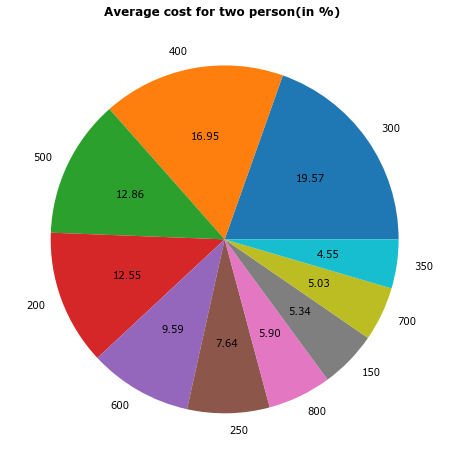

In [19]:

ZomatoData.rename(columns={'approx_cost(for two people)': 'average_cost'}, inplace=True)

plt.figure(figsize=(8,8))
values = ZomatoData.average_cost.value_counts()[:10]
labels = ZomatoData['average_cost'].value_counts()[:10].index
plt.pie(values, labels=labels, autopct='%.2f')
plt.title('Average cost for two person(in %) ', weight='bold')
plt.show()

Observation
For two person average cost will be 300 and 16.95% chance that cost will be 400. so on.

In [20]:
values = ZomatoData['cuisines'].value_counts()[:20]
labels=values.index
text=values.index
fig = go.Figure(data=[go.Pie(values=values,labels=labels,hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=3)))
fig.update_layout(title="Most popular cuisines of Bangalore ",
                  titlefont={'size': 30},
                  )
fig.show()




Analysis of Restaurants based on their Ratings


<AxesSubplot:xlabel='rate', ylabel='Density'>

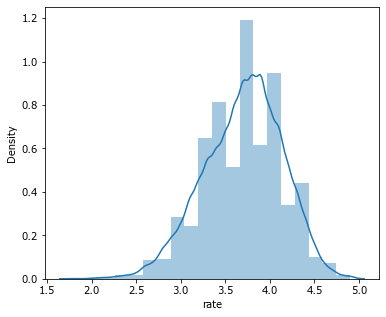

In [21]:
plt.figure(figsize=(6,5))
rating=ZomatoData['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3)  else np.nan ).dropna()
sns.distplot(rating,bins=20)

In [22]:
print("All unique restaurants ratings:")
ZomatoData.rate.unique()




All unique restaurants ratings:


array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [23]:
data.shape

(51717, 18)

In [24]:
#Replacing restaurants with their ratings given as New to NAN and dropping them finally 
data['rate'] = data['rate'].replace('NEW',np.NaN)
data['rate'] = data['rate'].replace('-',np.NaN)
data.dropna(how = 'any', inplace = True)
data['rate'] = data.loc[:,'rate'].replace('[ ]','',regex = True)
data['rate'] = data['rate'].astype(str)
data['rate'] = data['rate'].apply(lambda r: r.replace('/5',''))
data['rate'] = data['rate'].apply(lambda r: float(r))

In [25]:
data = ZomatoData
print("no. of restaurants between 1.5 and 2 rating:")
((data.rate>=1.5) & (data.rate<2)).sum()


no. of restaurants between 1.5 and 2 rating:


5

In [26]:
print("no. of restaurants between 2 and 2.5 rating:")
((data.rate>=2) & (data.rate<2.5)).sum()

no. of restaurants between 2 and 2.5 rating:


160

In [27]:
print("no. of restaurants between 2.5 and 3 rating:")
((data.rate>=2.5) & (data.rate<3)).sum()

no. of restaurants between 2.5 and 3 rating:


1009

In [28]:
print("no. of restaurants between 3.0 and 3.5 rating:")
((data.rate>=3.0) & (data.rate<3.5)).sum()

no. of restaurants between 3.0 and 3.5 rating:


1416

In [29]:
print("no. of restaurants between 3.5 and 4 rating:")
((data.rate>=3.5) & (data.rate<4)).sum()

no. of restaurants between 3.5 and 4 rating:


8707

In [30]:
print("no. of restaurants between 4 and 4.5 rating:")
((data.rate>=4) & (data.rate<4.5)).sum()

no. of restaurants between 4 and 4.5 rating:


10537

In [31]:
print("no. of restaurants between 4.5 and 5 rating:")
((data.rate>=4.5) & (data.rate<5)).sum()

no. of restaurants between 4.5 and 5 rating:


1212

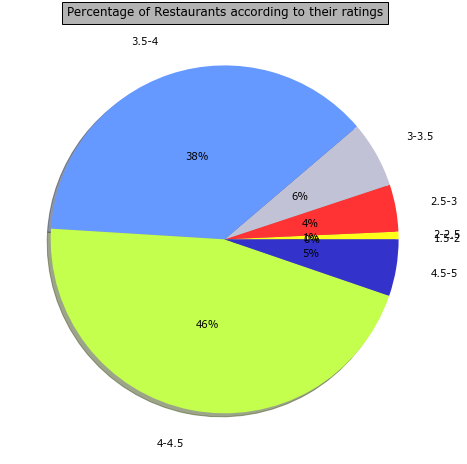

In [32]:
slices=[((data.rate>=1.5) & (data.rate<2)).sum(),
        ((data.rate>=2) & (data.rate<2.5)).sum(),
        ((data.rate>=2.5) & (data.rate<3)).sum(),
        ((data.rate>=3.0) & (data.rate<3.5)).sum(),
        ((data.rate>=3.5) & (data.rate<4)).sum(),
        ((data.rate>=4) & (data.rate<4.5)).sum(),
        ((data.rate>=4.5) & (data.rate<5)).sum()
       ]
labels=['1.5-2','2-2.5','2.5-3','3-3.5','3.5-4','4-4.5','4.5-5']
colors = ['#3333cc','#ffff1a','#ff3333','#c2c2d6','#6699ff','#c4ff4d']
plt.pie(slices,colors=colors, labels=labels, autopct='%1.0f%%', pctdistance=.5, labeldistance=1.2,shadow=True)
fig = plt.gcf()
plt.title("Percentage of Restaurants according to their ratings", bbox={'facecolor':'0.7', 'pad':5})

fig.set_size_inches(10,8)
plt.show()

Analysis of Restaurants based on their Online Delivery

In [33]:
x=ZomatoData['online_order'].value_counts()
colors = ['#FEBFB3', '#E1396C']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Accepting vs not accepting online orders",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

Text(0.5, 1.0, 'Type of Restaurants delivering online or Not')

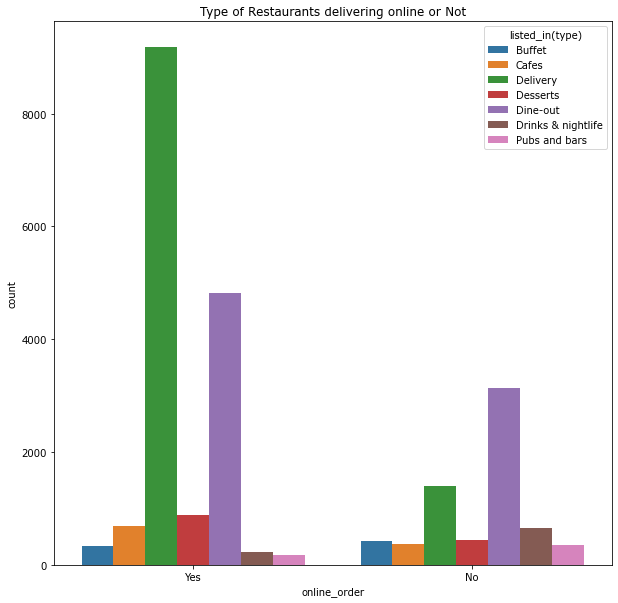

In [34]:
sns.countplot(x=data['online_order'], hue = data['listed_in(type)'])
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Type of Restaurants delivering online or Not')

Analysis of Restaurants based on their FoodType

In [35]:
print("all cuisine Types :")
cuisines = set()
for i in data['cuisines']:
    for j in str(i).split(', '):
        cuisines.add(j)
cuisines

all cuisine Types :


{'Afghan',
 'Afghani',
 'African',
 'American',
 'Andhra',
 'Arabian',
 'Asian',
 'Assamese',
 'Awadhi',
 'BBQ',
 'Bakery',
 'Bar Food',
 'Belgian',
 'Bengali',
 'Beverages',
 'Bihari',
 'Biryani',
 'Bohri',
 'British',
 'Bubble Tea',
 'Burger',
 'Burmese',
 'Cafe',
 'Cantonese',
 'Charcoal Chicken',
 'Chettinad',
 'Chinese',
 'Coffee',
 'Continental',
 'Desserts',
 'European',
 'Fast Food',
 'Finger Food',
 'French',
 'German',
 'Goan',
 'Greek',
 'Grill',
 'Gujarati',
 'Healthy Food',
 'Hyderabadi',
 'Ice Cream',
 'Indonesian',
 'Iranian',
 'Italian',
 'Japanese',
 'Jewish',
 'Juices',
 'Kashmiri',
 'Kebab',
 'Kerala',
 'Konkan',
 'Korean',
 'Lebanese',
 'Lucknowi',
 'Maharashtrian',
 'Malaysian',
 'Mangalorean',
 'Mediterranean',
 'Mexican',
 'Middle Eastern',
 'Mithai',
 'Modern Indian',
 'Momos',
 'Mughlai',
 'Naga',
 'Nepalese',
 'North Eastern',
 'North Indian',
 'Oriya',
 'Parsi',
 'Pizza',
 'Portuguese',
 'Rajasthani',
 'Roast Chicken',
 'Rolls',
 'Russian',
 'Salad',
 'Sandwi

In [36]:
data.shape

(23046, 18)

Spliting the cuisines column 

In [37]:
sep_cuisines = data['cuisines'].str.split(',', expand=True)

In [38]:
print(sep_cuisines)

                  0              1               2              3     4     5  \
0      North Indian        Mughlai         Chinese           None  None  None   
1           Chinese   North Indian            Thai           None  None  None   
2              Cafe        Mexican         Italian           None  None  None   
3      South Indian   North Indian            None           None  None  None   
4      North Indian     Rajasthani            None           None  None  None   
...             ...            ...             ...            ...   ...   ...   
51705  North Indian    Continental   Mediterranean           None  None  None   
51707   Finger Food           None            None           None  None  None   
51708       Chinese    Continental    North Indian           None  None  None   
51711        Andhra   South Indian         Chinese   North Indian  None  None   
51715   Finger Food           None            None           None  None  None   

          6     7  
0      

In [39]:
cuis = []
for i in range(8):
    cuis.append(i)
str_cuis = 'cuis'
cuis_col = [str_cuis + str(r + 1) for r in cuis]
sep_cuisines.columns = cuis_col

In [40]:
sep_cuisines

,cuis1,cuis2,cuis3,cuis4,cuis5,cuis6,cuis7,cuis8
0,North Indian,Mughlai,Chinese,None,None,None,None,None
1,Chinese,North Indian,Thai,None,None,None,None,None
2,Cafe,Mexican,Italian,None,None,None,None,None
3,South Indian,North Indian,None,None,None,None,None,None
4,North Indian,Rajasthani,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...
51705,North Indian,Continental,Mediterranean,None,None,None,None,None
51707,Finger Food,None,None,None,None,None,None,None
51708,Chinese,Continental,North Indian,None,None,None,None,None
51711,Andhra,South Indian,Chinese,North Indian,None,None,None,None


In [41]:
# sep_cuisines.fillna(0, inplace=True)

In [42]:
sep_cuisines

,cuis1,cuis2,cuis3,cuis4,cuis5,cuis6,cuis7,cuis8
0,North Indian,Mughlai,Chinese,None,None,None,None,None
1,Chinese,North Indian,Thai,None,None,None,None,None
2,Cafe,Mexican,Italian,None,None,None,None,None
3,South Indian,North Indian,None,None,None,None,None,None
4,North Indian,Rajasthani,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...
51705,North Indian,Continental,Mediterranean,None,None,None,None,None
51707,Finger Food,None,None,None,None,None,None,None
51708,Chinese,Continental,North Indian,None,None,None,None,None
51711,Andhra,South Indian,Chinese,North Indian,None,None,None,None


In [43]:
sep_cuisines['cuis1'] = sep_cuisines['cuis1'].astype(str).str.replace(" ", "")

In [44]:
sep_cuisines['cuis2'] = sep_cuisines['cuis2'].astype(str).str.replace(" ", "")

In [45]:
sep_cuisines['cuis3'] = sep_cuisines['cuis3'].astype(str).str.replace(" ", "")

In [46]:
sep_cuisines['cuis4'] = sep_cuisines['cuis4'].astype(str).str.replace(" ", "")

In [47]:
sep_cuisines['cuis5'] = sep_cuisines['cuis5'].astype(str).str.replace(" ", "")

In [48]:
sep_cuisines['cuis6'] = sep_cuisines['cuis6'].astype(str).str.replace(" ", "")

In [49]:
sep_cuisines['cuis7'] = sep_cuisines['cuis7'].astype(str).str.replace(" ", "")

In [50]:
sep_cuisines['cuis8'] = sep_cuisines['cuis8'].astype(str).str.replace(" ", "")

In [51]:
sep_cuisines

,cuis1,cuis2,cuis3,cuis4,cuis5,cuis6,cuis7,cuis8
0,NorthIndian,Mughlai,Chinese,None,None,None,None,None
1,Chinese,NorthIndian,Thai,None,None,None,None,None
2,Cafe,Mexican,Italian,None,None,None,None,None
3,SouthIndian,NorthIndian,None,None,None,None,None,None
4,NorthIndian,Rajasthani,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...
51705,NorthIndian,Continental,Mediterranean,None,None,None,None,None
51707,FingerFood,None,None,None,None,None,None,None
51708,Chinese,Continental,NorthIndian,None,None,None,None,None
51711,Andhra,SouthIndian,Chinese,NorthIndian,None,None,None,None


In [52]:
cuis_1= pd.get_dummies(sep_cuisines['cuis1'])
cuis_1

,African,American,Andhra,Arabian,Asian,Assamese,Awadhi,BBQ,Bakery,BarFood,...,SouthIndian,Spanish,Steak,StreetFood,Sushi,Tea,Thai,Tibetan,Turkish,Vietnamese
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51707,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51708,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51711,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
cuis_2= pd.get_dummies(sep_cuisines['cuis2'])



In [54]:
cuis_2

,Afghan,Afghani,African,American,Andhra,Arabian,Asian,BBQ,Bakery,Belgian,...,Steak,StreetFood,Sushi,Tea,Tex-Mex,Thai,Tibetan,Turkish,Vietnamese,Wraps
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51707,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51708,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51711,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [55]:
cuis_2['None']

0        0
1        0
2        0
3        0
4        0
        ..
51705    0
51707    1
51708    0
51711    0
51715    1
Name: None, Length: 23046, dtype: uint8

In [56]:
cuis_2.drop('None',axis=1,inplace=True)

In [57]:
cuis_2

,Afghan,Afghani,African,American,Andhra,Arabian,Asian,BBQ,Bakery,Belgian,...,Steak,StreetFood,Sushi,Tea,Tex-Mex,Thai,Tibetan,Turkish,Vietnamese,Wraps
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51707,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51708,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51711,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [58]:
cuis_3= pd.get_dummies(sep_cuisines['cuis3'])

In [59]:
cuis_3['None']

0        0
1        0
2        0
3        1
4        1
        ..
51705    0
51707    1
51708    0
51711    0
51715    1
Name: None, Length: 23046, dtype: uint8

In [60]:
cuis_3.drop('None',axis=1,inplace=True)

In [61]:
cuis_4= pd.get_dummies(sep_cuisines['cuis4'])
cuis_4.drop('None',axis=1,inplace=True)


In [62]:
cuis_5= pd.get_dummies(sep_cuisines['cuis5'])
cuis_5.drop('None',axis=1,inplace=True)


In [63]:
cuis_6= pd.get_dummies(sep_cuisines['cuis6'])
cuis_6.drop('None',axis=1,inplace=True)


In [64]:
cuis_7= pd.get_dummies(sep_cuisines['cuis7'])
cuis_7.drop('None',axis=1,inplace=True)


In [65]:
cuis_8= pd.get_dummies(sep_cuisines['cuis8'])
cuis_8.drop('None',axis=1,inplace=True)

In [66]:
merge_cuis= pd.concat([cuis_1,cuis_2,cuis_3,cuis_4,cuis_5,cuis_6,cuis_7,cuis_8],axis=1)

In [67]:
merge_cuis

,African,American,Andhra,Arabian,Asian,Assamese,Awadhi,BBQ,Bakery,BarFood,...,Japanese,Kebab,Kerala,NorthIndian,Pizza,Rolls,Salad,Seafood,SouthIndian,Thai
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51707,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51708,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51711,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [68]:
OHE_cuisine = merge_cuis.groupby(merge_cuis.columns, axis=1).sum()
print(OHE_cuisine)

       Afghan  Afghani  African  American  Andhra  Arabian  Asian  Assamese  \
0           0        0        0         0       0        0      0         0   
1           0        0        0         0       0        0      0         0   
2           0        0        0         0       0        0      0         0   
3           0        0        0         0       0        0      0         0   
4           0        0        0         0       0        0      0         0   
...       ...      ...      ...       ...     ...      ...    ...       ...   
51705       0        0        0         0       0        0      0         0   
51707       0        0        0         0       0        0      0         0   
51708       0        0        0         0       0        0      0         0   
51711       0        0        0         0       1        0      0         0   
51715       0        0        0         0       0        0      0         0   

       Awadhi  BBQ  ...  StreetFood  Sushi  Tea  Te

In [69]:
# OHE_cuisine['None']

In [70]:
OHE_cuisine.to_csv('OHE_cuis.csv')

In [71]:
# cuis_2.drop(0,axis=1)

In [72]:
print("Count of restaurants unique cuisines ")
Cuisines_Count=data['cuisines'].value_counts().sort_values(ascending=False)
Cuisines_Count

Count of restaurants unique cuisines 


North Indian                                                           1136
North Indian, Chinese                                                   777
South Indian                                                            359
Cafe                                                                    273
South Indian, North Indian, Chinese                                     233
                                                                       ... 
BBQ, Arabian, Rolls, Chinese, North Indian, Juices, Kebab, Desserts       1
Andhra, North Indian, South Indian                                        1
Street Food, Chinese, Italian, North Indian                               1
North Indian, Chinese, Arabian, Kebab                                     1
South Indian, Chinese, North Indian, Biryani                              1
Name: cuisines, Length: 1677, dtype: int64

In [73]:
ZomatoData.cuisines.describe()

count            23046
unique            1677
top       North Indian
freq              1136
Name: cuisines, dtype: object

In [74]:
# Get All the North Indian Food Serving Restaurants
NorthIndianFoodRestaurants = data[data['cuisines'].str.contains('North Indian|Bihari|Gujarati|Kashmiri|Lucknowi|Maharashtrian', case=False, regex=True,na=False)]
NorthIndianFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,3
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,3
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,2
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,2
5,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet,Banashankari,1


In [75]:
#Get All the Chinese Food Serving Restaurants
ChineseFoodRestaurants = data[data['cuisines'].str.contains('Chinese|Momos|Asian', case=False, regex=True,na=False)]
ChineseFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,3
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,3
9,https://www.zomato.com/bangalore/smacznego-ban...,"2470, 21 Main Road, 25th Cross, Banashankari, ...",Smacznego,Yes,No,4.2,504,+91 9945230807\r\n+91 9743804471,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,"[('Rated 4.0', ""RATED\n Easy to locate\nVFM 3...",[],Cafes,Banashankari,5
12,https://www.zomato.com/bangalore/the-coffee-sh...,"6th Block, 3rd Stage, Banashankari, Bangalore",The Coffee Shack,Yes,Yes,4.2,164,+91 9731644212,Banashankari,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500,"[('Rated 4.0', ""RATED\n Food - 4/5\nAmbience ...",[],Cafes,Banashankari,4
16,https://www.zomato.com/bangalore/catch-up-ino-...,"241, 4th Floor, 100 Feet Ring Road, Opposite K...",Catch-up-ino,Yes,No,3.9,133,+91 9972988038\r\n+91 9900121238,Banashankari,Cafe,"Momos, Mushroom Bruschettas, Jalapeno Cheeseba...","Cafe, Fast Food, Continental, Chinese, Momos",800,"[('Rated 1.0', ""RATED\n This place is right o...",[],Cafes,Banashankari,5


In [76]:
SouthIndianFoodRestaurants = data[data['cuisines'].str.contains('South Indian|Andhra|Chettinad', case=False, regex=True,na=False)]
SouthIndianFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,2
38,https://www.zomato.com/bangalore/empire-restau...,"4, Opposite NMKRV College, 21st C Cross Road, ...",Empire Restaurant,Yes,No,4.4,4884,080 49653266,Jayanagar,Casual Dining,"Chicken Tikka Masala, Mutton Keema Dosa, Mutto...","North Indian, Mughlai, South Indian, Chinese",750,"[('Rated 3.0', 'RATED\n Grill and tandoori is...",[],Delivery,Banashankari,4
53,https://www.zomato.com/bangalore/biryanis-and-...,"178, Next To Old KEB Office, 8th F Main Road, ...",Biryanis And More,Yes,No,4.0,618,080 48542442\r\n+91 7337271771,Jayanagar,Casual Dining,"Prawn Biryani, Dragon Chicken, Chicken Boneles...","Biryani, North Indian, Chinese, Andhra, South ...",750,"[('Rated 5.0', ""RATED\n Dear Biryanis and mor...",[],Delivery,Banashankari,5
76,https://www.zomato.com/bangalore/sri-guru-kott...,"49/1, Subbaraoshetty Road, Netkallappa Circle,...",Sri Guru Kottureshwara Davangere Benne Dosa,Yes,No,4.1,558,+91 9448305384\r\n+91 9060079480,Basavanagudi,Quick Bites,"Benne Dosa, Mirchi Bajji, Filter Coffee, Poha,...",South Indian,150,"[('Rated 4.0', 'RATED\n My go-to benne dosa p...","['Benne Dose', 'Benne Kali Dose', 'Open Dose',...",Delivery,Banashankari,1
79,https://www.zomato.com/bangalore/upahar-sagar-...,"727, 23rd Cross, KR Road, 2nd Stage, Banashank...",Upahar Sagar,No,No,3.8,39,+91 9164571705\r\n080 26760336,Banashankari,Quick Bites,Masala Dosa,"South Indian, Chinese, North Indian",350,"[('Rated 2.0', ""RATED\n Hi,\nWe had masala pu...",[],Delivery,Banashankari,3


In [77]:
ItalianFoodRestaurants = data[data['cuisines'].str.contains('Italian|Pizza', case=False, regex=True,na=False)]
ItalianFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,3
7,https://www.zomato.com/bangalore/onesta-banash...,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",Onesta,Yes,Yes,4.6,2556,080 48653961\r\n080 48655715,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,"[('Rated 5.0', 'RATED\n I personally really l...",[],Cafes,Banashankari,3
8,https://www.zomato.com/bangalore/penthouse-caf...,"1, 30th Main Road, 3rd Stage, Banashankari, Ba...",Penthouse Cafe,Yes,No,4.0,324,+91 8884135549\r\n+91 9449449316,Banashankari,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700,"[('Rated 3.0', ""RATED\n I had been to this pl...",[],Cafes,Banashankari,3
9,https://www.zomato.com/bangalore/smacznego-ban...,"2470, 21 Main Road, 25th Cross, Banashankari, ...",Smacznego,Yes,No,4.2,504,+91 9945230807\r\n+91 9743804471,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,"[('Rated 4.0', ""RATED\n Easy to locate\nVFM 3...",[],Cafes,Banashankari,5
11,https://www.zomato.com/bangalore/cafe-shuffle-...,"941, 3rd FLOOR, 21st Main, 22nd Cross, Banasha...",Cafe Shuffle,Yes,Yes,4.2,150,+91 9742166777,Banashankari,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600,"[('Rated 1.0', ""RATED\n \n\nHorrible. Not even...",[],Cafes,Banashankari,3


In [78]:
#Get All the Mexican Food Serving Restaurants
MexicanFoodRestaurants = data[data['cuisines'].str.contains('Mexican', case=False, regex=True,na=False)]
MexicanFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,3
9,https://www.zomato.com/bangalore/smacznego-ban...,"2470, 21 Main Road, 25th Cross, Banashankari, ...",Smacznego,Yes,No,4.2,504,+91 9945230807\r\n+91 9743804471,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,"[('Rated 4.0', ""RATED\n Easy to locate\nVFM 3...",[],Cafes,Banashankari,5
14,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Cafes,Banashankari,3
60,https://www.zomato.com/bangalore/peppy-peppers...,"942, 3rd Floor, 21st Main Road, 2nd Stage, Ban...",Peppy Peppers,No,No,4.2,244,+91 8042297555\r\n+91 7022455300,Banashankari,Casual Dining,"Pasta, Pepper Pizza, Paneer Pizza, Peppy Panee...","Italian, North Indian, Mexican",800,"[('Rated 4.0', ""RATED\n \nPeppy Peppers is loc...",[],Delivery,Banashankari,3
67,https://www.zomato.com/gustoesbeerhouse?contex...,"10, 30th Main, Deve Gowda Petrol Bunk Road, 3r...",Gustoes Beer House,No,No,4.1,868,080 49653521,Banashankari,Pub,"Beer, Wedges, Pizza, Nachos, Salads, Papaya Sa...","Continental, Italian, Mexican, North Indian, C...","1,200","[('Rated 5.0', 'RATED\n Has a really calm roo...",[],Delivery,Banashankari,6


In [79]:
#Get All the American Food Serving Restaurants
AmericanFoodRestaurants = data[data['cuisines'].str.contains('American|Burger', case=False, regex=True,na=False)]
AmericanFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
18,https://www.zomato.com/bangalore/t3h-cafe-bana...,"504, CJ Venkata Das Road, Padmanabhangar, 2nd ...",T3H Cafe,No,No,3.9,93,+91 8884726600,Banashankari,Cafe,"Cheese Maggi, Peri Peri Fries, Pasta Arrabiata","Cafe, Italian, American",300,"[('Rated 4.0', ""RATED\n Happy to see such a c...",[],Cafes,Banashankari,3
31,https://www.zomato.com/bangalore/foodiction-1-...,"2/1, 7th Main, Dwarakangar, Hosakeregalli, Ban...",Foodiction,Yes,No,2.8,506,+91 9916107070,Banashankari,Quick Bites,"Burgers, Lassi, Chicken Grill, Naan, Momos, Ch...","North Indian, Fast Food, Chinese, Burger",500,"[('Rated 1.0', ""RATED\n Worst restaurant ever...",[],Delivery,Banashankari,4
42,https://www.zomato.com/bangalore/mcdonalds-ban...,"2466, Bhaskar Grand Tower, 24th Cross, Opposit...",McDonald's,Yes,No,3.9,286,080 66000666\r\n080 42005285,Banashankari,Quick Bites,"Burgers, Fries, Hot Chocolate","Burger, Fast Food",500,"[('Rated 4.0', 'RATED\n Perfect place to have...",[],Delivery,Banashankari,2
55,https://www.zomato.com/bangalore/freshmenu-ban...,"10, Stavyah Arcade, 3rd Floor 9th Main, Yarab ...",FreshMenu,Yes,No,3.9,627,080 40424242,Banashankari,Delivery,"Salads, Sandwiches, Salad, Thai Rice, Pasta, N...","Healthy Food, Chinese, Biryani, North Indian, ...",450,"[('Rated 5.0', 'RATED\n What: continental foo...","[""Egg 'n' Chicken Ham Breakwich"", 'Maple Panca...",Delivery,Banashankari,8
153,https://www.zomato.com/bangalore/kfc-banashank...,"1, 80 Feet Road, 6th Block, 3rd Stage, Banasha...",KFC,Yes,No,3.8,505,080 33994444,Banashankari,Quick Bites,"Burgers, French Fries","Burger, Fast Food",450,"[('Rated 4.0', 'RATED\n KFC chicken yummy as ...",[],Delivery,Banashankari,2


In [80]:
#Get All the Mughlai Food Serving Restaurants
MughlaiFoodRestaurants = data[data['cuisines'].str.contains('Mughlai', case=False, regex=True,na=False)]
MughlaiFoodRestaurants.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,3
38,https://www.zomato.com/bangalore/empire-restau...,"4, Opposite NMKRV College, 21st C Cross Road, ...",Empire Restaurant,Yes,No,4.4,4884,080 49653266,Jayanagar,Casual Dining,"Chicken Tikka Masala, Mutton Keema Dosa, Mutto...","North Indian, Mughlai, South Indian, Chinese",750,"[('Rated 3.0', 'RATED\n Grill and tandoori is...",[],Delivery,Banashankari,4
151,https://www.zomato.com/bangalore/roll-n-rock-k...,"608, 21st Cross, Kumaraswamy Layout, Bangalore",Roll N Rock,Yes,No,3.8,124,+91 9590941992,Kumaraswamy Layout,Quick Bites,"Rolls, Paratha, Chicken Biryani","Chinese, North Indian, Mughlai, Rolls",400,"[('Rated 3.0', ""RATED\n Ordered paneer roll t...",[],Delivery,Banashankari,4
152,https://www.zomato.com/bangalore/box8-desi-mea...,"100 Feet Ring Road, 2nd Phase, Banashankari, B...",BOX8- Desi Meals,Yes,No,4.1,340,022 33552698,Banashankari,"Takeaway, Delivery","Paratha, Mughlai Chicken, Masala Lemonade, But...","North Indian, Mughlai, Fast Food",500,"[('Rated 4.0', 'RATED\n So recently during my...",[],Delivery,Banashankari,3
159,https://www.zomato.com/bangalore/wahab-jayanag...,"28/29, 9th Main Road, 3rd Block, Jayanagar, Ba...",Wahab,Yes,No,3.7,97,+91 9845088001,Jayanagar,Quick Bites,"Chicken Biryani, Rolls","North Indian, Mughlai, Chinese",350,"[('Rated 3.0', 'RATED\n Ordered chicken kabab...",[],Delivery,Banashankari,3


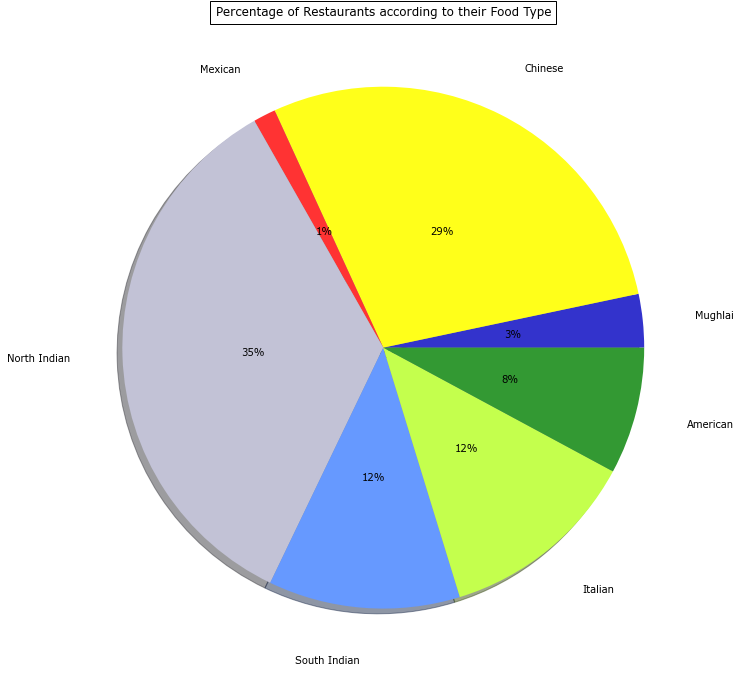

In [81]:
#pie chart showing % of various Food serving Type Restaurants
slices=[MughlaiFoodRestaurants.shape[0],
        ChineseFoodRestaurants.shape[0],
        MexicanFoodRestaurants.shape[0],
        NorthIndianFoodRestaurants.shape[0],
        SouthIndianFoodRestaurants.shape[0],
        ItalianFoodRestaurants.shape[0],
        AmericanFoodRestaurants.shape[0]]
labels=['Mughlai','Chinese','Mexican','North Indian','South Indian','Italian','American']
colors = ['#3333cc','#ffff1a','#ff3333','#c2c2d6','#6699ff','#c4ff4d','#339933']
plt.pie(slices,colors=colors, labels=labels, autopct='%1.0f%%', pctdistance=.5, labeldistance=1.2,shadow=True)
fig = plt.gcf()
plt.title("Percentage of Restaurants according to their Food Type", bbox={'facecolor':'1', 'pad':5})

fig.set_size_inches(12,12)
plt.show()

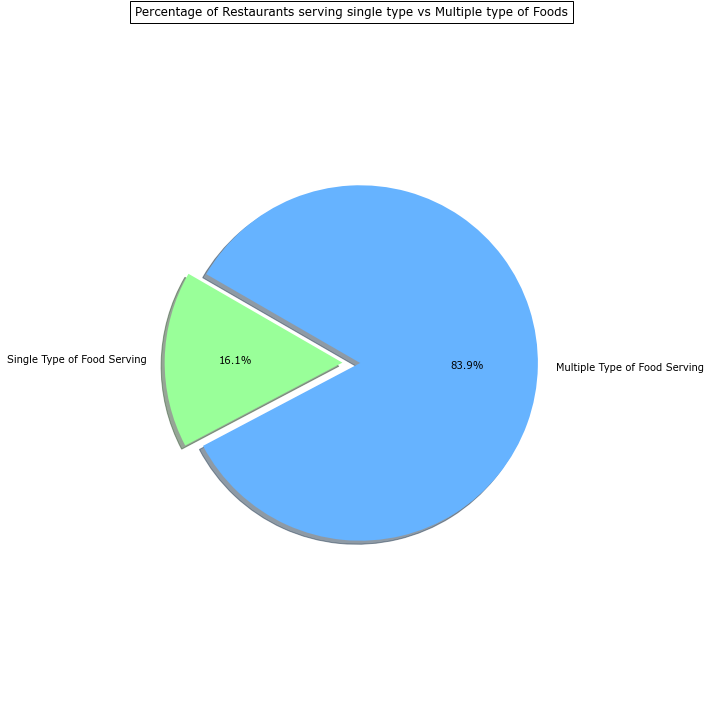

In [82]:
#Analysis of Restaurants Whether Single Cuisine or Multi Cusine
SingleTypeofFoodServing = data[data['cuisines'].str.contains(',', case=False, regex=True,na=False)==False]
MultipleTypeofFoodServing = data[data['cuisines'].str.contains(',', case=False, regex=True,na=False)]
# Pie chart showing Percentage of Restaurants serving single type vs Multiple type of Foods
labels = ['Single Type of Food Serving', 'Multiple Type of Food Serving', ]
sizes = [SingleTypeofFoodServing.shape[0], MultipleTypeofFoodServing.shape[0]]

explode = (0, 0.1)

colors = ['#99ff99','#66b3ff']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=150)

ax1.axis('equal')
plt.title("Percentage of Restaurants serving single type vs Multiple type of Foods", bbox={'facecolor':'1', 'pad':5})
fig1.set_size_inches(10,10)
plt.tight_layout()
plt.show()

# Number of Restaurants based on Services

In [83]:
!pip install plotly matplotlib seaborn --quiet
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [84]:
fig=px.histogram(ZomatoData['rest_type'],labels=dict(value='Type'))
fig.update_layout(title="Type of Services",
                  titlefont={'size': 30},template='simple_white'     
                  )
fig.update_traces(marker_color='darkorange', marker_line_color='black',
                  marker_line_width=2, opacity=1)

fig.show()

In [85]:
fig=px.histogram(ZomatoData['average_cost'],labels=dict(value='Cost Range'),nbins=10)
fig.update_layout(title="Cost of Restaurants",
                  titlefont={'size': 30},template='simple_white'     
                  )
fig.update_traces(marker_color='darkorange', marker_line_color='black',
                  marker_line_width=2, opacity=1)

fig.show()

# GEOSPATIAL ANALYSIS OF DATA :

LOCATION OF RESTAURANTS 

In [86]:
geolocator=Nominatim(user_agent="app")
A=len(data['location'].unique())
print('unique locations are  ' ,A)
locations=pd.DataFrame({"Name":data['location'].unique()})
locations.head()

unique locations are   88


,Name
0,Banashankari
1,Basavanagudi
2,Jayanagar
3,Kumaraswamy Layout
4,Rajarajeshwari Nagar


In [87]:
lat=[]
lon=[]
for location in locations['Name']:
    location = geolocator.geocode(location)    
    if location is None:
        lat.append(np.nan)
        lon.append(np.nan)
    else:
        lat.append(location.latitude)
        lon.append(location.longitude)
        
locations.head()        

,Name
0,Banashankari
1,Basavanagudi
2,Jayanagar
3,Kumaraswamy Layout
4,Rajarajeshwari Nagar


In [88]:
locations['lat']=lat
locations['lon']=lon

In [89]:
Rest_locations=pd.DataFrame(data['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations.head()

,Name,count
0,Koramangala 5th Block,1760
1,BTM,1446
2,Indiranagar,1334
3,HSR,1155
4,Jayanagar,1030


In [90]:


Restaurant_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Restaurant_locations.head()


Restaurant_locations[['lat','lon','count']]

,lat,lon,count
0,12.934377,77.628415,1760
1,45.954851,-112.496595,1446
2,12.973291,77.640467,1334
3,18.147500,41.538889,1155
4,27.643927,83.052805,1030
...,...,...,...
83,12.927441,77.515522,2
84,13.100698,77.596345,2
85,12.620128,77.433229,2
86,12.984852,77.540063,2


In [91]:
#### Bengaluru Coordinates - (12.9716° N, 77.5946° E)
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, zoom_start=default_zoom_start)
    return base_map

In [92]:
basemap=generateBaseMap()
basemap

In [93]:
HeatMap(Restaurant_locations[['lat','lon','count']],zoom=20,radius=15).add_to(basemap)
basemap


In [94]:

FastMarkerCluster(data=Restaurant_locations[['lat','lon','count']].values.tolist()).add_to(basemap)

basemap

# Heatmap for 'North Indian' Cuisines

In [95]:
df2= ZomatoData[ZomatoData['cuisines']=='North Indian']
df2.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
5,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet,Banashankari,1
94,https://www.zomato.com/bangalore/nandhini-delu...,"304, Opposite Apollo Public School, 100 Feet R...",Nandhini Deluxe,No,No,2.6,283,080 26890011\r\n080 26890033,Banashankari,Casual Dining,"Biryani, Chicken Guntur, Thali, Buttermilk, Ma...",North Indian,600,"[('Rated 3.0', 'RATED\n Ididnt like much.\n\n...",[],Delivery,Banashankari,1
191,https://www.zomato.com/bangalore/mini-punjabi-...,"7/1, Behind BMS College Hostel, Hanumantha Nag...",Mini Punjabi Dhaba,Yes,No,4.2,287,+91 9845044074\r\n+91 7406012344,Banashankari,Quick Bites,"Panneer Butter Masala, Lassi, Paratha, Jeera R...",North Indian,350,"[('Rated 4.0', 'RATED\n This place was introd...",[],Delivery,Banashankari,1
206,https://www.zomato.com/bangalore/dal-tadkaa-ba...,"1, Kathriguppe Main Road, 3rd Stage, Banashank...",Dal Tadkaa,Yes,No,2.5,247,080 26691763\r\n+91 9620138000,Banashankari,Casual Dining,"Paratha, Boondi Raita, Roti, Kulfi, Panneer Bu...",North Indian,500,"[('Rated 5.0', ""RATED\n I have never written ...",[],Delivery,Banashankari,1
257,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Delivery,Banashankari,1


In [96]:
north_india=df2.groupby('location')['url'].count().reset_index()
north_india.columns=['Name','count']
north_india.head()

,Name,count
0,BTM,86
1,Banashankari,10
2,Banaswadi,4
3,Bannerghatta Road,36
4,Basavanagudi,12


In [97]:
north_india=north_india.merge(locations,on="Name",how='left').dropna()

In [98]:
basemap=generateBaseMap()
HeatMap(north_india[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

# Heatmap for 'South Indian' Cuisines

In [99]:
def Heatmap_Zone(zone):
    df3=ZomatoData[ZomatoData['cuisines']==zone]
    df_zone=df3.groupby(['location'],as_index=False)['url'].agg('count')
    df_zone.columns=['Name','count']
    df_zone=df_zone.merge(locations,on="Name",how='left').dropna()
    basemap=generateBaseMap()
    HeatMap(df_zone[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
    return basemap

In [100]:
ZomatoData['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ..., 'Andhra, Hyderabadi, Biryani',
       'Andhra, North Indian, South Indian', 'Thai, Chinese, Momos'],
      dtype=object)

In [101]:
Heatmap_Zone('South Indian')

# WordCloud for Dishes in each Restaurant Type:

In [102]:
from wordcloud import WordCloud, STOPWORDS 

dfupd=ZomatoData.copy()
dfupd['update_dish_liked']=dfupd['dish_liked'].apply(lambda x : x.split(',') if type(x)==str else [''])
rest=dfupd['rest_type'].value_counts()[:9].index


In [103]:
dfupd.dropna(axis='index',subset=['rest_type'],inplace=True)
dfupd.dropna(axis='index',subset=['dish_liked'],inplace=True)




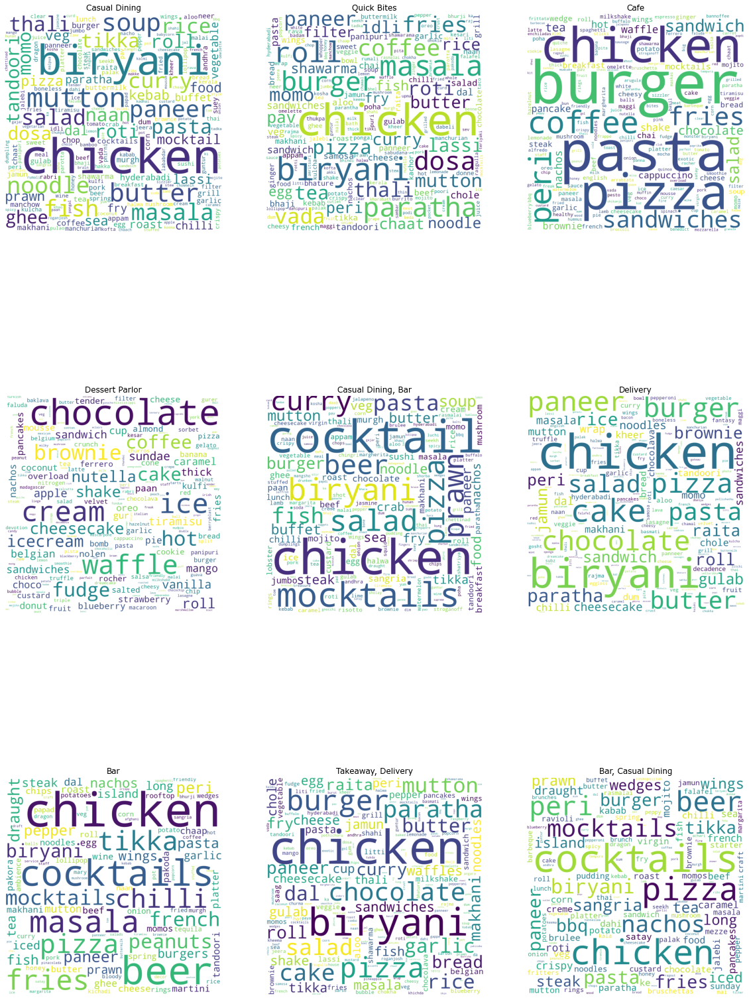

In [104]:
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,restaurant in enumerate(rest):
        plt.subplot(3,3,i+1)
        dishes=''
        data=dfupd[dfupd['rest_type']==restaurant]
        for word in data['dish_liked']:
            words=word.split()
            # Converts each token into lowercase 
            for i in range(len(words)): 
                words[i] = words[i].lower() 
            dishes=dishes+ " ".join(words)+" "
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,stopwords = stopwords,width=1200, height=1200).generate(dishes)
        plt.imshow(wordcloud)
        plt.title(restaurant)
        plt.axis("off")
        
        
stopwords = set(STOPWORDS) 
produce_wordcloud(rest)        

# [Analysing Reviews]()<a id="26"></a><br>

- In this section we will go on to prepare reviews dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.

In [105]:
all_ratings = []

for name,ratings in tqdm(zip(ZomatoData['name'],ZomatoData['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name,score, doc])

23046it [00:15, 1486.29it/s]


In [106]:
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))

In [107]:
rating_df.to_csv("Ratings.csv")

In [108]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


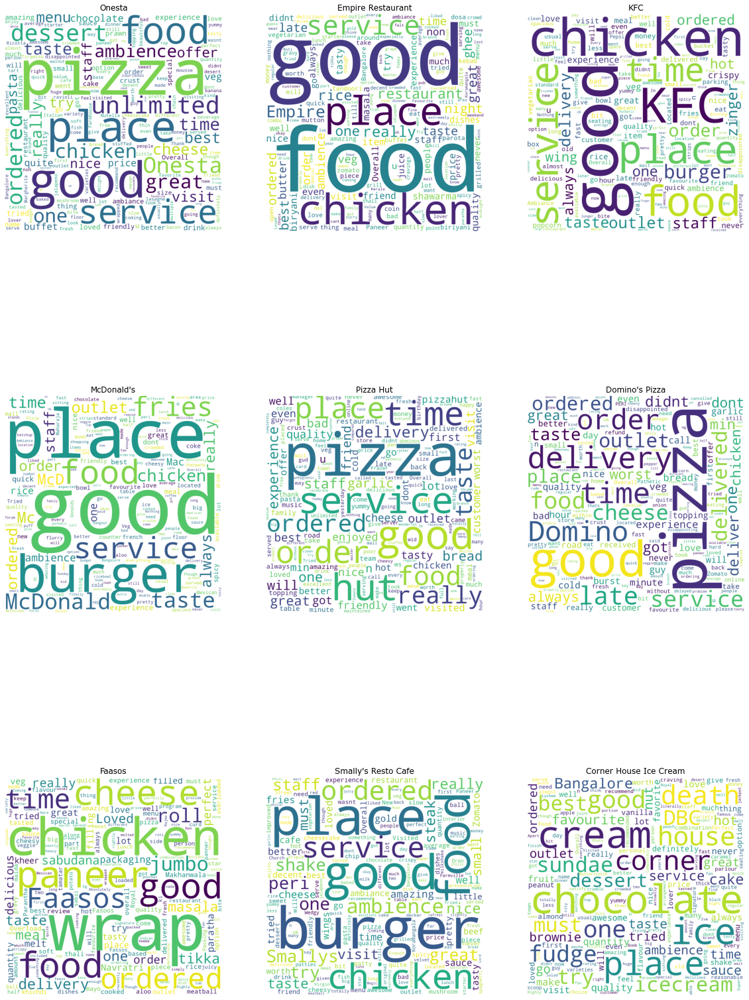

In [109]:
rest=ZomatoData['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

# Rating distribution

Text(0, 0.5, 'count')

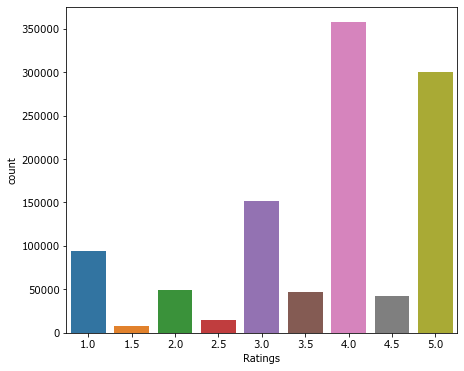

In [110]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index,y=rating)
plt.xlabel("Ratings")
plt.ylabel('count')

#  Sentimental Analysis

# Topic modeling for positive comments
As the first step we will divide comments as negative and positive on the basis on rating provided.
Comments with rating below 2.5 is classified as negative and greater tham 2.5 as classified as positive.


In [111]:
import re
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk
# Any results you write to the current directory are saved as output.

In [112]:
rating_df['sent']=rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)

In [113]:
stops=stopwords.words('english')
lem=WordNetLemmatizer()
corpus=' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==1]['review'][:3000] if x not in stops)
tokens=word_tokenize(corpus)

In [114]:

vect=TfidfVectorizer()
vect_fit=vect.fit(tokens)
    

In [115]:
id_map=dict((v,k) for k,v in vect.vocabulary_.items())
vectorized_data=vect_fit.transform(tokens)
gensim_corpus=gensim.matutils.Sparse2Corpus(vectorized_data,documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus,id2word=id_map,num_topics=5,random_state=34,passes=25)

## Visualizing output

In [116]:
counter=Counter(corpus)

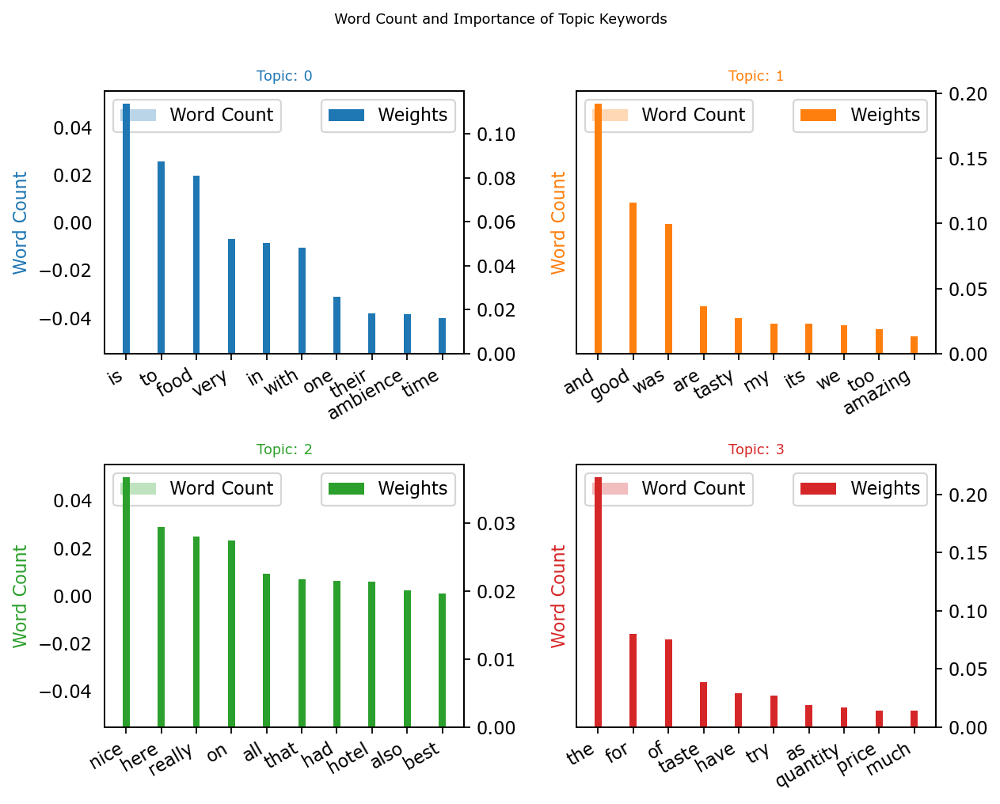

In [117]:
out=[]
topics=ldamodel.show_topics(formatted=False)
for i,topic in topics:
    for word,weight in topic:
        out.append([word,i,weight,counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        


# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(8,6), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    #ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()

In [118]:
stops=stopwords.words('english')
lem=WordNetLemmatizer()
corpus=' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==0]['review'][:3000] if x not in stops)
tokens=word_tokenize(corpus)

In [119]:
tokens

['Its',
 'a',
 'restaurant',
 'near',
 'to',
 'Banashankari',
 'BDA',
 'Me',
 'along',
 'with',
 'few',
 'of',
 'my',
 'office',
 'friends',
 'visited',
 'to',
 'have',
 'buffet',
 'but',
 'unfortunately',
 'they',
 'only',
 'provide',
 'veg',
 'buffet',
 'On',
 'inquiring',
 'they',
 'said',
 'this',
 'place',
 'is',
 'mostly',
 'visited',
 'by',
 'vegetarians',
 'Anyways',
 'we',
 'ordered',
 'ala',
 'carte',
 'items',
 'which',
 'took',
 'ages',
 'to',
 'come',
 'Food',
 'was',
 'ok',
 'ok',
 'Definitely',
 'not',
 'visiting',
 'anymore',
 'I',
 'had',
 'a',
 'very',
 'bad',
 'experience',
 'here',
 'I',
 'dont',
 'know',
 'about',
 'a',
 'la',
 'carte',
 'but',
 'the',
 'buffet',
 'was',
 'the',
 'worst',
 'They',
 'gave',
 'us',
 'complementary',
 'drink',
 'and',
 'momos',
 'before',
 'the',
 'buffet',
 'The',
 'momos',
 'were',
 'really',
 'good',
 'The',
 'number',
 'of',
 'varieties',
 'first',
 'of',
 'all',
 'was',
 'very',
 'disappointing',
 'The',
 'service',
 'was',
 'ver

In [120]:
vect=TfidfVectorizer()
vect_fit=vect.fit(tokens)
id_map=dict((v,k) for k,v in vect.vocabulary_.items())
vectorized_data=vect_fit.transform(tokens)
gensim_corpus=gensim.matutils.Sparse2Corpus(vectorized_data,documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus,id2word=id_map,num_topics=5,random_state=34,passes=25)

In [121]:
vectorized_data.shape

(105135, 4314)

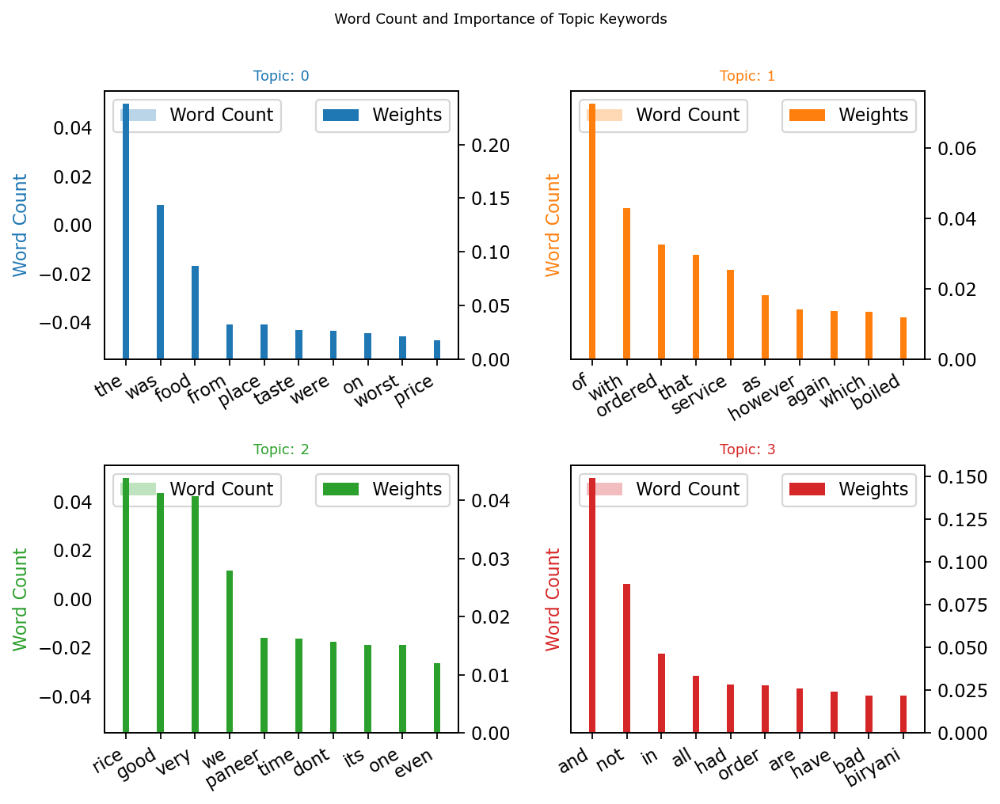

In [122]:
counter=Counter(corpus)
out=[]
topics=ldamodel.show_topics(formatted=False)
for i,topic in topics:
    for word,weight in topic:
        out.append([word,i,weight,counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        


# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(8,6), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    #ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()

# T-SNE of Reviews

In [123]:
stops=set(stopwords.words('english'))
lem=WordNetLemmatizer()
corpus=[]
for review in tqdm(rating_df['review'][:10000]):
    words=[]
    for x in word_tokenize(review):
        x=lem.lemmatize(x.lower())
        if x not in stops:
            words.append(x)
            
    corpus.append(words)

100%|██████████| 10000/10000 [00:03<00:00, 3256.59it/s]


In [124]:
model = word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)

In [125]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(10, 10)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


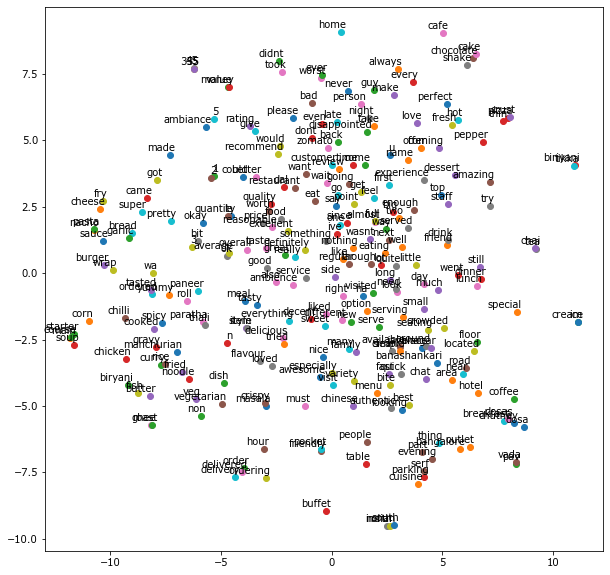

In [126]:
tsne_plot(model)

# T-SNE of adjectivs used in postive reviews

In [127]:
postive=rating_df[rating_df['rating']>3]['review'][:2000]
negative=rating_df[rating_df['rating']<2.5]['review'][:2000]

def return_corpus(df):
    corpus=[]
    for review in df:
        tagged=nltk.pos_tag(word_tokenize(review))
        adj=[]
        for x in tagged:
            if x[1]=='JJ':
                adj.append(x[0])
        corpus.append(adj)
    return corpus

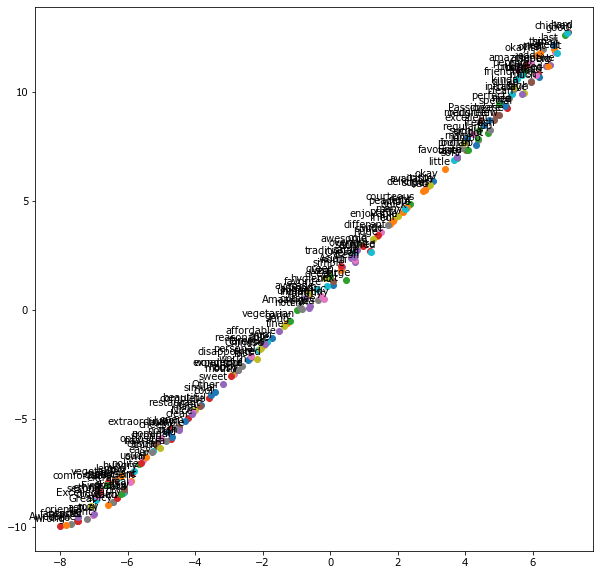

In [128]:
corpus=return_corpus(postive)
model = word2vec.Word2Vec(corpus, size=100, min_count=10,window=20, workers=4)
tsne_plot(model)

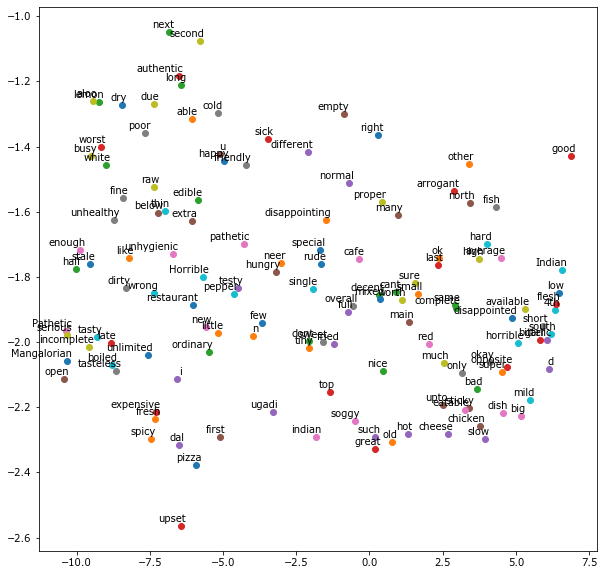

In [129]:
corpus=return_corpus(negative)
model = word2vec.Word2Vec(corpus, size=100, min_count=10,window=20, workers=4)
tsne_plot(model)

Data preparation


In [130]:
rating_df['sent']=rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)

In [131]:
max_features=3000
tokenizer=Tokenizer(num_words=max_features,split=' ')
tokenizer.fit_on_texts(rating_df['review'].values)
X = tokenizer.texts_to_sequences(rating_df['review'].values)
X = pad_sequences(X)


In [132]:
tokenizer

In [ ]:
embed_dim = 32
lstm_out = 32

model = Sequential()
model.add(Embedding(max_features, embed_dim,input_length = X.shape[1]))
#model.add(SpatialDropout1D(0.4))
model.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(2,activation='softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())

# Train and test split

In [ ]:
Y = pd.get_dummies(rating_df['sent'].astype(int)).values
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.30, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)



In [ ]:
batch_size = 3200
model.fit(X_train, Y_train, epochs = 5, batch_size=batch_size)


In [ ]:
validation_size = 1500

X_validate = X_test[-validation_size:]
Y_validate = Y_test[-validation_size:]
X_test = X_test[:-validation_size]
Y_test = Y_test[:-validation_size]
score,acc = model.evaluate(X_test, Y_test, verbose = 2, batch_size = batch_size)
print("score: %.2f" % (score))
print("acc: %.2f" % (acc))

# RATING PREDICTION 

In [134]:
ZomatoData

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,listed_in(type),listed_in(city),CuisineCount
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,3
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,3
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,3
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,2
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,https://www.zomato.com/bangalore/izakaya-gastr...,"2nd Floor, Iona, Virginia Mall, Whitefield Mai...",Izakaya Gastro Pub,Yes,Yes,3.8,128,+91 7625087121\n+91 8050587483,Whitefield,"Bar, Casual Dining","Beer, Chicken Guntur, Paneer Tikka, Fish, Nood...","North Indian, Continental, Mediterranean","1,200","[('Rated 3.0', ""RATED\n Nice place to hangout...",[],Pubs and bars,Whitefield,3
51707,https://www.zomato.com/bangalore/m-bar-bengalu...,"Bengaluru Marriott Hotel, 75, 8th Road, EPIP A...",M Bar - Bengaluru Marriott Hotel Whitefield,No,No,3.9,77,080 49435000,Whitefield,"Fine Dining, Bar",Rooftop Ambience,Finger Food,"2,000","[('Rated 4.0', 'RATED\n Went there post dinne...",[],Pubs and bars,Whitefield,1
51708,https://www.zomato.com/bangalore/keys-cafe-key...,"Keys Hotel, 6, 1st Phase Industrial Area, Near...",Keys Cafe - Keys Hotel,No,No,2.8,161,080 39451000\n+91 8884038484,Whitefield,"Casual Dining, Bar","Salads, Coffee, Breakfast Buffet, Halwa, Chick...","Chinese, Continental, North Indian","1,200","[('Rated 3.0', 'RATED\n Place is good not tha...",[],Pubs and bars,Whitefield,3
51711,https://www.zomato.com/bangalore/bhagini-2-whi...,"139/C1, Next To GR Tech Park, Pattandur Agraha...",Bhagini,No,No,2.5,81,080 65951222,Whitefield,"Casual Dining, Bar","Biryani, Andhra Meal","Andhra, South Indian, Chinese, North Indian",800,"[('Rated 4.0', 'RATED\n A fine place to chill...",[],Pubs and bars,Whitefield,4


In [135]:
df = ZomatoData

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23046 entries, 0 to 51715
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              23046 non-null  object 
 1   address          23046 non-null  object 
 2   name             23046 non-null  object 
 3   online_order     23046 non-null  object 
 4   book_table       23046 non-null  object 
 5   rate             23046 non-null  float64
 6   votes            23046 non-null  int64  
 7   phone            23046 non-null  object 
 8   location         23046 non-null  object 
 9   rest_type        23046 non-null  object 
 10  dish_liked       23046 non-null  object 
 11  cuisines         23046 non-null  object 
 12  average_cost     23046 non-null  object 
 13  reviews_list     23046 non-null  object 
 14  menu_item        23046 non-null  object 
 15  listed_in(type)  23046 non-null  object 
 16  listed_in(city)  23046 non-null  object 
 17  CuisineCount

In [137]:
df.isna().sum()

url                0
address            0
name               0
online_order       0
book_table         0
rate               0
votes              0
phone              0
location           0
rest_type          0
dish_liked         0
cuisines           0
average_cost       0
reviews_list       0
menu_item          0
listed_in(type)    0
listed_in(city)    0
CuisineCount       0
dtype: int64

In [138]:
del df['url']
del df['address']
del df['phone']
del df['reviews_list']
del df['menu_item']
del df['name']
del df['CuisineCount']
df.head()

,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,average_cost,listed_in(type),listed_in(city)
0,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari


# Remove Duplicates value

In [139]:
df.duplicated().sum()

41

In [140]:
df.drop_duplicates(inplace=True)

In [141]:
22216
df['votes']=df['votes'].astype('int32')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23005 entries, 0 to 51715
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   online_order     23005 non-null  object 
 1   book_table       23005 non-null  object 
 2   rate             23005 non-null  float64
 3   votes            23005 non-null  int32  
 4   location         23005 non-null  object 
 5   rest_type        23005 non-null  object 
 6   dish_liked       23005 non-null  object 
 7   cuisines         23005 non-null  object 
 8   average_cost     23005 non-null  object 
 9   listed_in(type)  23005 non-null  object 
 10  listed_in(city)  23005 non-null  object 
dtypes: float64(1), int32(1), object(9)
memory usage: 2.0+ MB


In [142]:
df['average_cost']=df['average_cost'].str.replace(",","")
df['average_cost'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '750', '200', '850', '1200', '150', '350', '250', '1500', '1300',
       '1000', '100', '900', '1100', '1600', '950', '230', '1700', '1350',
       '2200', '1400', '2000', '1800', '1900', '180', '330', '2500',
       '2100', '3000', '2800', '3400', '40', '1250', '3500', '4000',
       '2400', '1450', '3200', '6000', '1050', '4100', '2300', '120',
       '2600', '5000', '3700', '1650', '2700', '4500'], dtype=object)

In [143]:
df=df.rename(columns={"average_cost" : "avg_cost",
                      "listed_in(type)" : "meal_type", 
                      "listed_in(city)" : "city"})
df.head()

,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,avg_cost,meal_type,city
0,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari


In [144]:
df.dropna(subset=['rate','avg_cost','rest_type'],inplace=True)


In [145]:
df['avg_cost']=df['avg_cost'].astype(int)

In [146]:
df.shape

(23005, 11)

In [147]:
df['rate']=df['rate'].astype(float)
df.isna().sum()

online_order    0
book_table      0
rate            0
votes           0
location        0
rest_type       0
dish_liked      0
cuisines        0
avg_cost        0
meal_type       0
city            0
dtype: int64

In [148]:
df=df[df.cuisines.isna()==False]
df=df[df.rest_type.isna()==False]
df.isna().sum()

online_order    0
book_table      0
rate            0
votes           0
location        0
rest_type       0
dish_liked      0
cuisines        0
avg_cost        0
meal_type       0
city            0
dtype: int64

In [149]:
df['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Jayanagar', 'Kumaraswamy Layout',
       'Rajarajeshwari Nagar', 'Mysore Road', 'Uttarahalli',
       'South Bangalore', 'Vijay Nagar', 'Bannerghatta Road', 'JP Nagar',
       'BTM', 'Wilson Garden', 'Koramangala 5th Block', 'Shanti Nagar',
       'Richmond Road', 'City Market', 'Bellandur', 'Sarjapur Road',
       'Marathahalli', 'HSR', 'Old Airport Road', 'Indiranagar',
       'Koramangala 1st Block', 'East Bangalore', 'MG Road',
       'Brigade Road', 'Lavelle Road', 'Church Street', 'Ulsoor',
       'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road', 'Domlur',
       'Koramangala 8th Block', 'Frazer Town', 'Ejipura', 'Vasanth Nagar',
       'Jeevan Bhima Nagar', 'Old Madras Road', 'Commercial Street',
       'Koramangala 6th Block', 'Majestic', 'Langford Town',
       'Koramangala 7th Block', 'Brookefield', 'Whitefield',
       'ITPL Main Road, Whitefield', 'Varthur Main Road, Whi

In [150]:
df['city'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

In [151]:
del df['location']
df.head()

,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,avg_cost,meal_type,city
0,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari


# Data Preprocessing
Data transformation
lets Convert categorical data into numerical data using LabelEncoding
Now we drop unwanted Columns

In [152]:
df=df.drop(['dish_liked','meal_type'],axis=1)
data1 = df

In [153]:
data1.head()

,online_order,book_table,rate,votes,rest_type,cuisines,avg_cost,city
0,Yes,Yes,4.1,775,Casual Dining,"North Indian, Mughlai, Chinese",800,Banashankari
1,Yes,No,4.1,787,Casual Dining,"Chinese, North Indian, Thai",800,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Banashankari
3,No,No,3.7,88,Quick Bites,"South Indian, North Indian",300,Banashankari
4,No,No,3.8,166,Casual Dining,"North Indian, Rajasthani",600,Banashankari


In [154]:
df_2=df

In [155]:
df_2.drop('cuisines',axis=1,inplace=True)

In [156]:
df_2

,online_order,book_table,rate,votes,rest_type,avg_cost,city
0,Yes,Yes,4.1,775,Casual Dining,800,Banashankari
1,Yes,No,4.1,787,Casual Dining,800,Banashankari
2,Yes,No,3.8,918,"Cafe, Casual Dining",800,Banashankari
3,No,No,3.7,88,Quick Bites,300,Banashankari
4,No,No,3.8,166,Casual Dining,600,Banashankari
...,...,...,...,...,...,...,...
51705,Yes,Yes,3.8,128,"Bar, Casual Dining",1200,Whitefield
51707,No,No,3.9,77,"Fine Dining, Bar",2000,Whitefield
51708,No,No,2.8,161,"Casual Dining, Bar",1200,Whitefield
51711,No,No,2.5,81,"Casual Dining, Bar",800,Whitefield


In [157]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [158]:
list1=['online_order','book_table','rest_type','city']
for i in list1:
    df[i]=le.fit_transform(df[i])

df.head()

,online_order,book_table,rate,votes,rest_type,avg_cost,city
0,1,1,4.1,775,20,800,1
1,1,0,4.1,787,20,800,1
2,1,0,3.8,918,16,800,1
3,0,0,3.7,88,62,300,1
4,0,0,3.8,166,20,600,1


In [159]:
list2=['online_order','book_table','rest_type','city']
for i in list2:
    df_2[i]=le.fit_transform(df_2[i])

df_2.head()


,online_order,book_table,rate,votes,rest_type,avg_cost,city
0,1,1,4.1,775,20,800,1
1,1,0,4.1,787,20,800,1
2,1,0,3.8,918,16,800,1
3,0,0,3.7,88,62,300,1
4,0,0,3.8,166,20,600,1


In [160]:
df_3=pd.concat([df_2,OHE_cuisine],axis=1)

In [161]:
df_3

,online_order,book_table,rate,votes,rest_type,avg_cost,city,Afghan,Afghani,African,...,StreetFood,Sushi,Tea,Tex-Mex,Thai,Tibetan,Turkish,Vegan,Vietnamese,Wraps
0,1.0,1.0,4.1,775.0,20.0,800.0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1.0,0.0,4.1,787.0,20.0,800.0,1.0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,1.0,0.0,3.8,918.0,16.0,800.0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,3.7,88.0,62.0,300.0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,3.8,166.0,20.0,600.0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51705,1.0,1.0,3.8,128.0,5.0,1200.0,29.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51707,0.0,0.0,3.9,77.0,38.0,2000.0,29.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51708,0.0,0.0,2.8,161.0,21.0,1200.0,29.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51711,0.0,0.0,2.5,81.0,21.0,800.0,29.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Data Transformation
6.1 Feature Selection and Feature Scaling
Select the feature and Label(target) from the data

In [162]:
#Drop null values
df_3.dropna(how='any',inplace=True)
df_3.shape

(23005, 104)

In [163]:
df.dropna(how='any',inplace=True)
df.shape

(23005, 7)

In [164]:
# selecing features
features=df_3.drop(['rate'],axis=1)
features.shape

(23005, 103)

In [165]:
features.dtypes

online_order    float64
book_table      float64
votes           float64
rest_type       float64
avg_cost        float64
                 ...   
Tibetan           uint8
Turkish           uint8
Vegan             uint8
Vietnamese        uint8
Wraps             uint8
Length: 103, dtype: object

In [166]:
features_1=data1.drop(['rate'],axis=1)
features_1.shape

(23005, 6)

In [167]:
features_1.dtypes

online_order    int64
book_table      int64
votes           int32
rest_type       int64
avg_cost        int32
city            int64
dtype: object

In [168]:
df_3['rate'].unique()

array([4.1, 3.8, 3.7, 4.6, 4. , 4.2, 3.9, 3. , 3.6, 2.8, 4.4, 3.1, 4.3,
       2.6, 3.3, 3.5, 3.2, 4.5, 2.5, 2.9, 3.4, 2.7, 4.7, 2.4, 2.2, 2.3,
       4.8, 4.9, 2.1, 2. , 1.8])

In [169]:
# selecting Class/ Label
label=df_3['rate'].values
label

array([4.1, 4.1, 3.8, ..., 2.8, 2.5, 4.3])

In [170]:
label_1=df['rate'].values
label_1

array([4.1, 4.1, 3.8, ..., 2.8, 2.5, 4.3])

# Feature Scaling

In [171]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

In [172]:
features=StandardScaler().fit(features).transform(features)
features

array([[ 0.64359368,  1.68027792,  0.15332228, ..., -0.01615181,
        -0.08209331, -0.04667092],
       [ 0.64359368, -0.59513964,  0.16406939, ..., -0.01615181,
        -0.08209331, -0.04667092],
       [ 0.64359368, -0.59513964,  0.28139197, ..., -0.01615181,
        -0.08209331, -0.04667092],
       ...,
       [-1.55377536, -0.59513964, -0.39657137, ..., -0.01615181,
        -0.08209331, -0.04667092],
       [-1.55377536, -0.59513964, -0.46821875, ..., -0.01615181,
        -0.08209331, -0.04667092],
       [-1.55377536,  1.68027792, -0.32940195, ..., -0.01615181,
        -0.08209331, -0.04667092]])

In [173]:
features_1=StandardScaler().fit(features_1).transform(features_1)
features_1

array([[ 0.64359368,  1.68027792,  0.15332228, -0.63321274,  0.08895016,
        -1.63259984],
       [ 0.64359368, -0.59513964,  0.16406939, -0.63321274,  0.08895016,
        -1.63259984],
       [ 0.64359368, -0.59513964,  0.28139197, -0.8282137 ,  0.08895016,
        -1.63259984],
       ...,
       [-1.55377536, -0.59513964, -0.39657137, -0.5844625 ,  0.8564248 ,
         1.79685862],
       [-1.55377536, -0.59513964, -0.46821875, -0.5844625 ,  0.08895016,
         1.79685862],
       [-1.55377536,  1.68027792, -0.32940195, -1.41321658,  3.35071739,
         1.79685862]])

In [174]:
features.shape

(23005, 103)

In [175]:
features_1.shape

(23005, 6)

In [176]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(features,label,test_size=0.30,random_state=42)

In [177]:
from sklearn.model_selection import train_test_split
X_train_1,X_test_1,y_train_1,y_test_1=train_test_split(features_1,label_1,test_size=0.30,random_state=42)

In [178]:
# Check the shape of splited data
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((16103, 103), (6902, 103), (16103,), (6902,))

# Apply Regressions Models


# 1. Linear Regression

In [179]:
from sklearn.linear_model import LinearRegression
lin_reg=LinearRegression()
lin_reg

LinearRegression()

In [180]:
lin_reg.fit(X_train,y_train)

LinearRegression()

In [181]:
print(lin_reg.score(X_train,y_train))
print(lin_reg.score(X_test,y_test))

0.33823964248505256
0.3202527868265589


In [182]:
lin_reg_pred=lin_reg.predict(X_test)

In [183]:
from sklearn.metrics import r2_score
lin_reg_score=r2_score(y_test,lin_reg_pred)*100
print("Accuracy score for LR :",lin_reg_score)

Accuracy score for LR : 32.02527868265589


#with cuisines column not seperated 

In [184]:
lin_reg.fit(X_train_1,y_train_1)

LinearRegression()

In [185]:
print(lin_reg.score(X_train_1,y_train_1))
print(lin_reg.score(X_test_1,y_test_1))

0.22026023183373833
0.21331593071892996


In [186]:
lin_reg_pred_1=lin_reg.predict(X_test_1)

In [187]:
from sklearn.metrics import r2_score
lin_reg_score_1=r2_score(y_test_1,lin_reg_pred_1)*100
print("Accuracy score for LR :",lin_reg_score_1)

Accuracy score for LR : 21.331593071892996


# Random Forest Regressor

In [188]:

rfr=RandomForestRegressor()
rfr

RandomForestRegressor()

In [189]:
rfr.fit(X_train,y_train)

RandomForestRegressor()

In [190]:
print(rfr.score(X_train,y_train))
print(rfr.score(X_test,y_test))

0.9824882057525797
0.8642831373225326


In [191]:
rfr_pred=rfr.predict(X_test)
from sklearn.metrics import r2_score

rfr_score=r2_score(y_test,rfr_pred)*100
print("Accuracy score for RFR :",rfr_score)

Accuracy score for LR : 86.42831373225326


#with cuisines column not seperated 

In [192]:
rfr.fit(X_train_1,y_train_1)

RandomForestRegressor()

In [193]:
print(rfr.score(X_train_1,y_train_1))
print(rfr.score(X_test_1,y_test_1))

0.9715044491162441
0.7874261056598045


In [194]:
rfr_pred_1=rfr.predict(X_test_1)

In [195]:
from sklearn.metrics import r2_score
rfr_reg_score_1=r2_score(y_test_1,rfr_pred_1)*100
print("Accuracy score for RFR :",rfr_reg_score_1)

Accuracy score for LR : 78.74261056598046


# Support Vector Regression

In [196]:
from sklearn.svm import SVR
svr=SVR()
svr.fit(X_train,y_train)

SVR()

In [198]:
print(svr.score(X_train,y_train))
print(svr.score(X_test,y_test))

0.517388647116545
0.46423878026073917


In [199]:
svr_pred=svr.predict(X_test)

In [200]:
from sklearn.metrics import r2_score

svr_score=r2_score(y_test,svr_pred)*100
print("Accuracy score for SVR :",svr_score)

Accuracy score for SVR : 46.423878026073915


#with cuisines column not seperated

In [201]:
svr.fit(X_train_1,y_train_1)

SVR()

In [202]:
print(svr.score(X_train_1,y_train_1))
print(svr.score(X_test_1,y_test_1))

0.3057889256909637
0.28826085695249604


In [203]:
svr_pred_1=svr.predict(X_test_1)

In [204]:
from sklearn.metrics import r2_score
svr_reg_score_1=r2_score(y_test_1,svr_pred_1)*100
print("Accuracy score for SVR :",svr_reg_score_1)

Accuracy score for SVR : 28.826085695249603


# Lasso

In [205]:
from sklearn.linear_model import Lasso

In [206]:
lr=Lasso()
lr

Lasso()

In [207]:
lr.fit(X_train,y_train)

Lasso()

In [208]:
print(lr.score(X_train,y_train))
print(lr.score(X_test,y_test))

0.0
-0.0007412956936054815


In [209]:
lr_pred=lr.predict(X_test)

In [210]:
from sklearn.metrics import r2_score

lr_score=r2_score(y_test,lr_pred)*100
print("Accuracy score for Lasso :",lr_score)

Accuracy score for Lasso : -0.07412956936054815


#with cuisines column not seperated

In [211]:
lr.fit(X_train_1,y_train_1)

Lasso()

In [212]:
print(lr.score(X_train_1,y_train_1))
print(lr.score(X_test_1,y_test_1))

0.0
-0.0007412956936054815


In [213]:
lr_pred_1=lr.predict(X_test_1)

In [214]:
from sklearn.metrics import r2_score
lr_reg_score_1=r2_score(y_test_1,lr_pred_1)*100
print("Accuracy score for Lasso :",lr_reg_score_1)

Accuracy score for Lasso : -0.07412956936054815


# DECISION TREE REGRESSION

In [215]:
from sklearn.tree import DecisionTreeRegressor

In [216]:
DTree=DecisionTreeRegressor(min_samples_leaf=.0001)

In [217]:
DTree.fit(X_train,y_train)
DTree_predict=DTree.predict(X_test)

In [228]:
from sklearn.metrics import r2_score
DTree_reg_score=r2_score(y_test,DTree_predict)*100
print("Accuracy score for DTree :",DTree_reg_score)

Accuracy score for DTree : 77.03544653085343


#with cuisines column not seperated

In [219]:
DTree.fit(X_train_1,y_train_1)

DecisionTreeRegressor(min_samples_leaf=0.0001)

In [220]:
print(DTree.score(X_train_1,y_train_1))
print(DTree.score(X_test_1,y_test_1))

0.9478429926683921
0.6699470580211799


In [221]:
DTree_pred_1=DTree.predict(X_test_1)

In [222]:
from sklearn.metrics import r2_score
DTree_reg_score_1=r2_score(y_test_1,DTree_pred_1)*100
print("Accuracy score for DTree :",DTree_reg_score_1)

Accuracy score for DTree : 66.99470580211799


# We can bserve that without the cuisines column being seperated , all the 5 algorithms would have lesser values of accuracy.

# PREDICT THE RATING with Random Forest Regressor Model

In [223]:
#rfr.predict([[1,0,13,73,1900,350,27]])

In [224]:
sample=pd.DataFrame({"Actual Rating":y_test,
             "Predicted Rating":np.round(rfr_pred,3)})
sample

,Actual Rating,Predicted Rating
0,4.2,4.132
1,3.8,3.653
2,3.9,3.895
3,3.9,3.882
4,4.1,4.102
...,...,...
6897,4.0,3.997
6898,4.5,4.458
6899,3.9,3.898
6900,2.8,2.883


In [226]:
sample.to_csv("Model Prediction Sample.csv",index=False)